In [1]:
import openslide
import cv2 as cv
import os
import io
import numpy as np
import tensorflow as tf
import csv

from tensorflow.keras.models import load_model
from tqdm import tqdm
from skimage.filters import threshold_otsu
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib.gridspec import GridSpec
from PIL import Image

from multiprocessing import Pool
from itertools import product
import time
import threading
# from itertools import compress

In [2]:
print("TensorFLow - Versão: ",tf.__version__)

# Checar GPUs
if not tf.test.gpu_device_name():
    warnings.warn('GPU não encontrada.')
else:
    print(f'Dispositivo GPU padrão: {tf.test.gpu_device_name()}')
    print("Número de GPUs Disponíveis: ", len(tf.config.list_physical_devices('GPU')))

TensorFLow - Versão:  2.11.0
Dispositivo GPU padrão: /device:GPU:0
Número de GPUs Disponíveis:  1


In [3]:
# Carrega a imagem com o OpenSlide
tcga_name = 'TCGA-CD-A489-01Z-00-DX1.AB03DA27-6A86-41C7-9305-E5400E6C47AC'
wsi = openslide.OpenSlide('annotation_geojson/images/svs/' + tcga_name + '.svs')

In [4]:
wsi.level_dimensions

((88535, 56782), (22133, 14195), (5533, 3548), (2766, 1774))

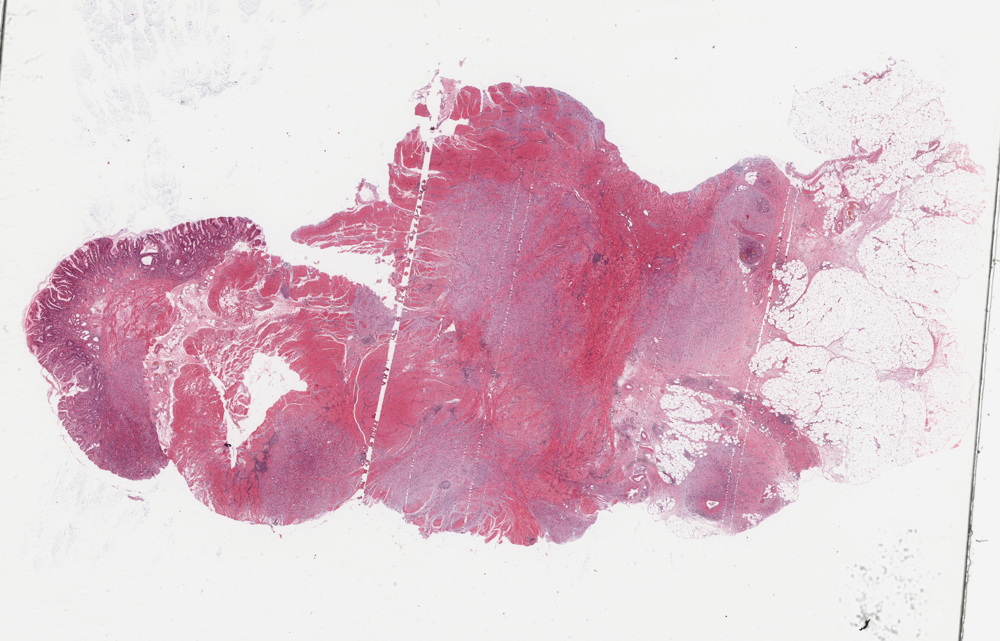

In [5]:
# Pega a menor dimensão disponível na imagem
level = len(wsi.level_dimensions) - 1

# Ler toda a imagem na menor dimensão
img = wsi.read_region((0, 0), level, wsi.level_dimensions[level]).convert('RGB')

# Exibir a imagem
img.show()

del(level, tcga_name)

In [6]:
# Obtém o tamanho da imagem real
w, h = wsi.dimensions

# Define o tamanho do patch
patch_size = 224

# Torna as dimenções multiplas de 224
width = w + (patch_size - w%patch_size)
hight = h + (patch_size - h%patch_size)

In [7]:
width, hight

(88704, 56896)

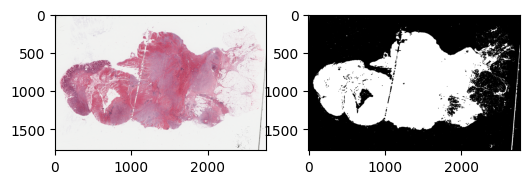

In [8]:
# Converte a imagem para tons de cinza
gray_img = cv.cvtColor(np.array(img), cv.COLOR_RGBA2GRAY)

# Aplica o limiar global
_, thresh = cv.threshold(gray_img, 0, 255, cv.THRESH_BINARY_INV+cv.THRESH_OTSU)

# Aplica uma operação morfológica para remover pequenos objetos e buracos na máscara
kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (7, 7))
mask = cv.morphologyEx(thresh, cv.MORPH_CLOSE, kernel)

plt.figure(figsize=(6,10))

plt.subplot(1,2,1)
plt.imshow(img)

plt.subplot(1,2,2)
plt.imshow(mask, cmap='gray')

plt.show()

mask = cv.resize(mask, (width, hight))

del(gray_img, thresh, kernel, w, h, img)

### Quantização

In [9]:
TF_LITE_QA_MODEL_FILE_NAME = 'annotation_geojson/models/TCGA-CD-A489_qat_sinete_model_1.tflite'

In [10]:
# Carregar o modelo TFLite
interpreter = tf.lite.Interpreter(model_path=TF_LITE_QA_MODEL_FILE_NAME)
interpreter.allocate_tensors()

# Obter detalhes do modelo
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Preparar os dados de entrada
input_shape = input_details[0]['shape']

### Gerando Heatmap

In [11]:
def _process_block(y, x):
    # Recortar bloco da máscara
    mask_slide = mask[y:y+slide_dim, x:x+slide_dim]
    
    prediction_xy = 0
    prediction_list = []
    coord_list = []
    
    mean = np.mean(mask_slide)
    
    # Verificar se há componentes de análise
    if mean > 16:
        # Processar sub-blocos da máscara
        
        indices = np.arange(0, slide_dim, patch_size)

        # Processar a imagem em blocos
        for m in indices:
            for n in indices:   
                # Recortar o bloco da máscara                
                mask_block = mask_slide[m:m+patch_size, n:n+patch_size]

                # Verifica se a mascara tem componetes de análise
                if np.mean(mask_block) > 16:
                
                    # Calcular coordenadas absolutas do bloco
                    abs_y = y + m
                    abs_x = x + n

                    # Recortar o bloco da imagem
                    img_block = wsi.read_region((abs_x, abs_y), 0, (patch_size, patch_size)).convert('RGB')
                    
                    # Converter o bloco para o formato numpy
                    img_block = np.array(img_block, dtype=np.float32)[:, :, ::-1] # converter RGB para BGR
                    
                    # Adicionando uma dimensão extra para criar um batch de tamanho 1
                    img_block = np.expand_dims(img_block, axis=0)

                    # Definir os dados de entrada no tensor do modelo
                    interpreter.set_tensor(input_details[0]['index'], img_block)

                    # Executar a predição
                    interpreter.invoke()

                    # Obter os resultados da predição
                    prediction_xy = interpreter.get_tensor(output_details[0]['index'])[0][0]
                    y_coord, x_coord = int(abs_y/patch_size), int(abs_x/patch_size)
                    
                    if prediction_xy > 0.6:
                        if (y_coord<hight/224-1 or x_coord<width/224-1):
                            # Salvar resultado na matriz de heatmap
                            coord_list.append((y_coord, x_coord))
                            prediction_list.append(prediction_xy)
                    
    return coord_list, prediction_list

In [12]:
lock = threading.Lock()

# Definir parâmetros
c = 15
slide_dim = patch_size*c
jet_colors = cm.get_cmap("jet")(np.arange(256))[:, :3]

# Determinar os índices dos blocos na imagem
y_indices = np.arange(0, hight, slide_dim)
x_indices = np.arange(0, width, slide_dim)

# Matriz que irá receber as predições
jet_heatmap_matrix = np.zeros((int(hight/patch_size), int(width/patch_size)), dtype=np.float16)
# print(jet_heatmap_matrix.shape)

start_time = time.time()

# Processar a imagem em blocos em paralelo
with Pool() as pool:
    results = pool.starmap(_process_block, product(y_indices, x_indices))
        
for lista_de_coordenadas, lista_de_valores in results:
    for coordenada,valor in zip(lista_de_coordenadas, lista_de_valores):
        x, y = coordenada
        jet_heatmap_matrix[x][y] = valor
    
end_time = time.time()

# Calcular métricas de desempenho
total_time = end_time - start_time
minutos, segundos = divmod(total_time, 60)
milisegundos = int((segundos - int(segundos))*1000)

print(f'Tempo de execução:\n00:0{int(minutos)}:{int(segundos)}.{milisegundos}')

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.8/dist-p

Tempo de execução:
00:00:59.300


In [13]:
heatmap_matrix = np.uint8(255 * jet_heatmap_matrix)

jet_heatmap = jet_colors[heatmap_matrix]

jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)

# Salvar a imagem como JPEG
jet_heatmap.save(f'heat_maps_images/hm_TCGA-CD-A489_qat.jpg', quality=100)  # Ajuste o valor de qualidade (0-100) conforme necessário

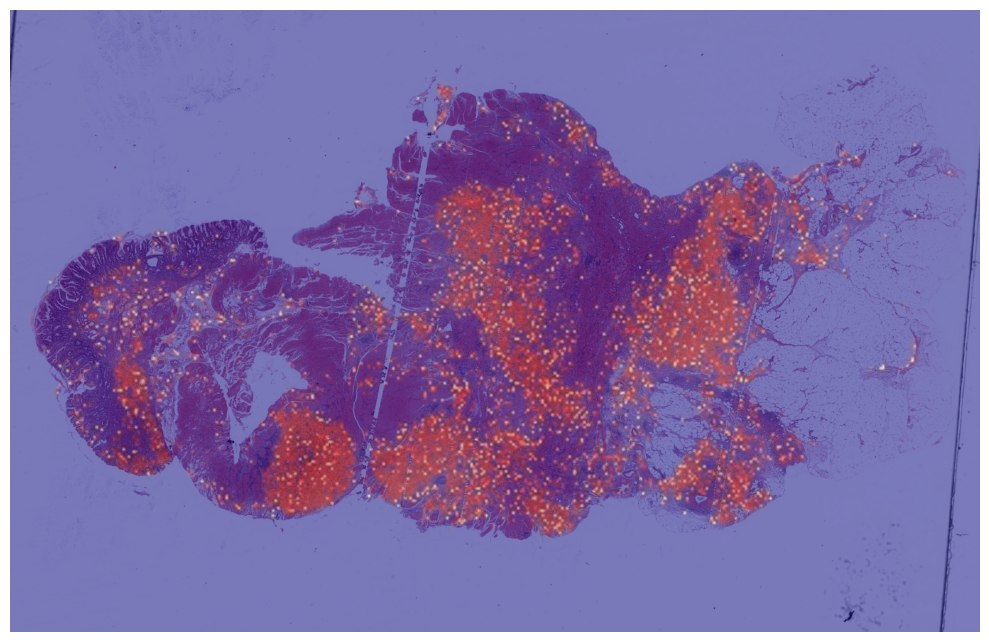

In [14]:
# Ler toda a imagem na menor dimensão
img = wsi.read_region((0, 0), 3, wsi.level_dimensions[3]).convert('RGB')

img_array = np.array(img, dtype=np.float32)#[:, :, ::-1]
jet_heatmap = Image.open('heat_maps_images/hm_TCGA-CD-A489_qat.jpg')
jet_heatmap = jet_heatmap.resize((img_array.shape[1], img_array.shape[0]))

superimposed_img = np.array(jet_heatmap)*1 + img_array 
superimposed_img = tf.keras.utils.array_to_img(superimposed_img)
superimposed_img.save(f'heat_maps_images/superimposed_TCGA-CD-A489_qat.jpg', quality=100)  # Ajuste o valor de qualidade (0-100) conforme necessário
# Plotando figuras
plt.figure(figsize=(10,12))
plt.imshow(superimposed_img)
plt.axis('off')

# Ajuste de layout
plt.tight_layout()

plt.show()